<a href="https://colab.research.google.com/github/rtsjngdx/StreamDiffusion/blob/main/Multires_Textual_Inversion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multiresolution Textual Inversion

![](https://github.com/giannisdaras/multires_textual_inversion/blob/main/images/example_dog.png?raw=true)

Using a couple of images, we learn a concept at different resolutions.

Once learned, the user can generate images at different levels of agreement to the original concept: **"A photo of <S(0)>"** produces the exact object while the prompt: **"A photo of <S(0.8)>"** only matches the rough outlines and colors.

Our framework allows us to generate images that use different resolutions of an image (e.g. details, textures, styles) as separate pseudo-words that can be composed in various ways.





## Project Setup

In [12]:
#@title Clone the repo
!git clone https://github.com/giannisdaras/multires_textual_inversion.git

Cloning into 'multires_textual_inversion'...
remote: Enumerating objects: 125, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 125 (delta 0), reused 0 (delta 0), pack-reused 124
Receiving objects: 100% (125/125), 14.64 MiB | 27.82 MiB/s, done.
Resolving deltas: 100% (58/58), done.


In [ ]:
cd multires_textual_inversion/

/content/multires_textual_inversion


In [13]:
#@title Install requirements and download some images
!pip install --upgrade -r requirements.txt
# Download some images
!python scrape_images.py

Traceback (most recent call last):
  File "/content/multires_textual_inversion/multires_textual_inversion/scrape_images.py", line 13, in <module>
    models_list = api.list_models(author="sd-concepts-library", sort="likes", direction=-1)[:TOP_K]
TypeError: 'generator' object is not subscriptable


In [14]:
#@title Imports and utils
from pipeline import DreamBoothMultiResPipeline, MultiResPipeline, load_learned_concepts
import torch
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Login to HuggingFace Hub

In [15]:
from huggingface_hub import notebook_login

notebook_login()

## Experiment with pre-trained concepts


In [16]:
#@title Download pre-trained Textual Inversion concepts
!gdown --id 1HhksfGmQh6xAiS2MIi6kMe430iHl2PGj && unzip textual_inversion_outputs && mv outputs textual_inversion_outputs
!gdown --id 1u8bBM85ncM2D6lusMPG-PIBSN6fktCec && unzip jane.zip && mv jane/ textual_inversion_outputs

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (uriginal): https://drive.google.com/uc?id=1HhksfGmQh6xAiS2MIi6kMe430iHl2PGj
From (redirected): https://drive.google.com/uc?id=1HhksfGmQh6xAiS2MIi6kMe430iHl2PGj&confirm=t&uuid=05af4513-38ab-4be6-beba-15a36326d1cb
To: /content/multires_textual_inversion/multires_textual_inversion/textual_inversion_outputs.zip
100% 679M/679M [00:08<00:00, 82.2MB/s]
Archive:  textual_inversion_outputs.zip
   creating: outputs/
   creating: outputs/cat-toy/
   creating: outputs/cat-toy/text_encoder/
  inflating: outputs/cat-toy/text_encoder/config.json  
  inflating: outputs/cat-toy/text_encoder/pytorch_model.bin  
   creating: outputs/gta5-artwork/
   creating: outputs/gta5-artwork/text_encoder/
  inflating: outputs/gta5-artwork/text_encoder/config.json  
  inflating: outpu

In [17]:
#@title Initialize model
model_id = "runwayml/stable-diffusion-v1-5"
pipe = MultiResPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision="fp16", use_auth_token=True)
pipe = pipe.to("cuda")

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.70k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/307 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/822 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

  0%|          | 0/51 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


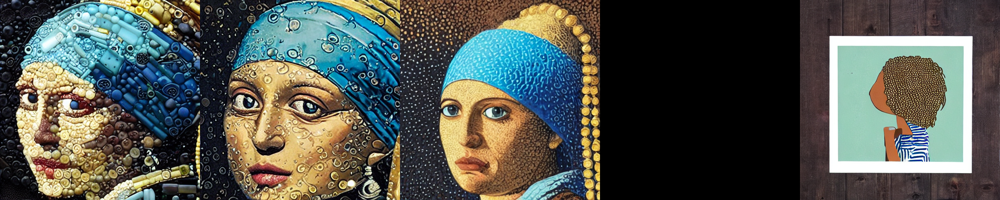

In [18]:
#@title Generate images at different resolutions with Semi-Resolution Dependent Sampling

prompts = []

selected_i = [0, 3, 5, 7, 9]
for i in selected_i:
  prompts.append(f"An image of <jane({i})>")


string_to_param_dict = load_learned_concepts(pipe, "textual_inversion_outputs/")
image = pipe(prompts, string_to_param_dict, seed=42)
image_grid(image, 1, len(prompts))

  0%|          | 0/51 [00:00<?, ?it/s]

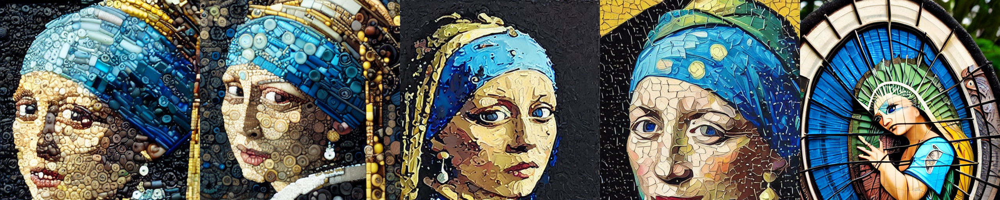

In [19]:
#@title Generate images at different resolutions with Fully-Resolution Dependent Sampling

prompts = []

selected_i = [0, 3, 5, 7, 9]
for i in selected_i:
  prompts.append(f"An image of <jane[{i}]>")


string_to_param_dict = load_learned_concepts(pipe, "textual_inversion_outputs/")
image = pipe(prompts, string_to_param_dict, seed=42)
image_grid(image, 1, len(prompts))

  0%|          | 0/51 [00:00<?, ?it/s]

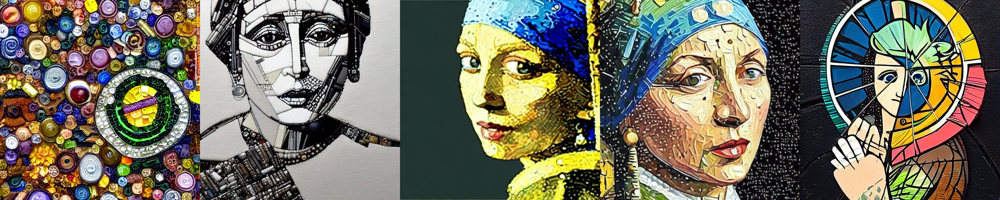

In [20]:
#@title Generate images at different resolutions with Fixed Resolution Sampling

prompts = []

selected_i = [0, 3, 5, 7, 9]
for i in selected_i:
  prompts.append(f"An image of <jane|{i}|>")


string_to_param_dict = load_learned_concepts(pipe, "textual_inversion_outputs/")
image = pipe(prompts, string_to_param_dict, seed=42)
image_grid(image, 1, len(prompts))

  0%|          | 0/51 [00:00<?, ?it/s]

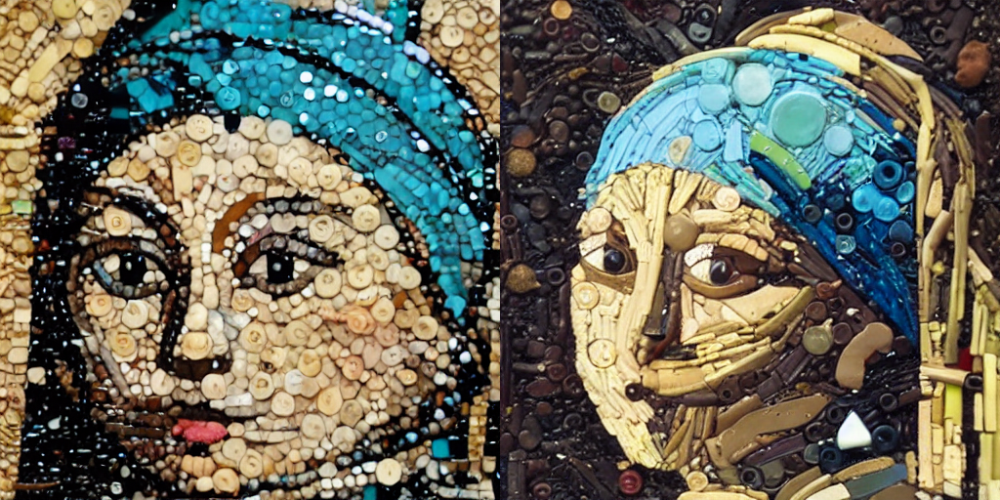

In [21]:
#@title Try your own prompts

#@markdown For Semi-Resolution Dependent Sampling use: <prompt_name(prompt_index)>

#@markdown For Fully-Resolution Dependent Sampling use: <prompt_name[prompt_index]>

#@markdown For Fixed Resolution Sampling use: <prompt_name|prompt_index|>

#@markdown For the pre-trained concepts, prompt_index is an integer in \[0, 9\]


prompt = "An image of a cat in the style of \u003Cjane(0)>" #@param {type:"string"}

num_samples = 2 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

all_images = []
string_to_param_dict = load_learned_concepts(pipe, "textual_inversion_outputs/")

for _ in range(num_rows):
    images = pipe([prompt] * num_samples, string_to_param_dict, seed=42)
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid


## Train a new Textual Inversion Model

In [22]:
#@markdown Add here the URLs to the images of the concept you are adding. 3-5 should be fine
urls = [
      "https://huggingface.co/datasets/valhalla/images/resolve/main/2.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/3.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/5.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/6.jpeg",
      ## You can add additional images here
      ]


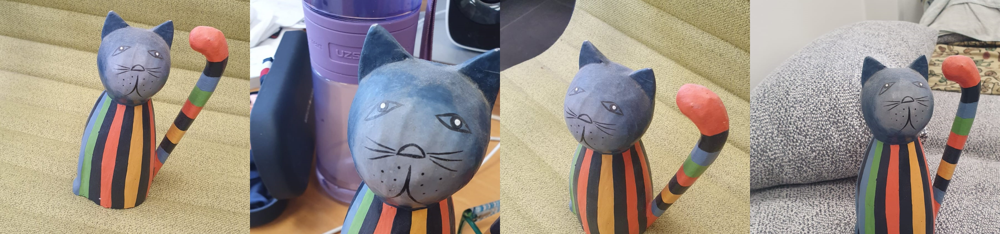

In [23]:
#@title Setup and check the images you have just added
import requests
import glob
from io import BytesIO
import os

def download_image(url):
  try:
    response = requests.get(url)
  except:
    return None
  return Image.open(BytesIO(response.content)).convert("RGB")

images = list(filter(None,[download_image(url) for url in urls]))
save_path = "datasets/my_concept"
if not os.path.exists(save_path):
  os.mkdir(save_path)
[image.save(f"{save_path}/{i}.jpeg") for i, image in enumerate(images)]
image_grid(images, 1, len(images))

In [24]:
# Train a new Textual Inversion concept
%env MODEL_NAME=runwayml/stable-diffusion-v1-5
%env CONCEPT_NAME=my_concept


!accelerate launch train_textual_inversion.py \
    --pretrained_model_name_or_path=$MODEL_NAME  \
    --train_data_dir=datasets/$CONCEPT_NAME \
    --learnable_property="style" \
    --placeholder_token="S" \
    --initializer_token="cat" \
    --output_dir=textual_inversion_outputs/$CONCEPT_NAME \
    --resolution=512 \
    --train_batch_size=1 \
    --gradient_accumulation_steps=4 \
    --max_train_steps=3000 \
    --learning_rate=5.0e-04 \
    --scale_lr \
    --lr_scheduler="constant" \
    --lr_warmup_steps=0

env: MODEL_NAME=runwayml/stable-diffusion-v1-5
env: CONCEPT_NAME=my_concept
The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
CUDA backend failed to initialize: Found CUDA version 12010, but JAX was built against version 12020, which is newer. The copy of CUDA that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
Traceback (most recent call last):
  File "/content/multires_textual_inversion/multires_textual_inversion/train_textual_inversion.py", line 604, in <module>
    main()
  File "/content/multires_textual_inversion/multires_textual_inversion/train_textual_inversion.py"